# Geomechanical Injection Scenario Toolkit (GIST)

#Disclaimer
GIST aims to give the _gist_ of a wide range of potential scenarios and aid collective decision making when responding to seismicity.

The results of GIST are entirely dependent upon the inputs provided, which may be incomplete or inaccurate.

There are other potentially plausible inducement scenarios that are not considered, including fluid migration into the basement, 
out-of-zone poroelastic stressing, or hydraulic fracturing.

None of the individual models produced by GIST accurately represent what happens in the subsurface and cannot be credibly used 
to accurately assign liability or responsibility for seismicity.

"All models are wrong, but some are useful" - George Box, 1976

## Prerequisites

Assumes GIST_RunTemplate has completed.

##Install Dependencies
- geopandas
- geodatasets
- matplotlib
- folium
- mapclassify
- contextily

In [0]:
%restart_python

In [0]:
%run "/Workspace/_utils/Utility_Functions"

In [0]:
!pip install geopandas
!pip install geodatasets
!pip install folium matplotlib mapclassify contextily

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.
Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.
Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


##Paths

In [0]:
# Paths
homePath='/Workspace/Users/bill.curry@exxonmobil.com/'
# Injection data path 
injPath=homePath+'injection/WeeklyRun/ScheduledOutput/'
# GIST library path
gistPath=homePath+'GIST/'

##Libraries

- os
- numpy
- scipy
- pandas
- matplotlib
- geopandas
- pyspark
- seaborn
- contextily
- gistPlots
- gistMC
- eqSQL


In [0]:
import sys
sys.path.append(gistPath)
sys.path.append(gistPath+'lib')

In [0]:
import numpy as np
import pandas as pd
import os
import gistMC as gi
import eqSQL as es
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas
import contextily as cx
import gistPlots as gp
import seaborn.objects as so

#1. Select Event

In [0]:
eventID='texnet2024oqfb'

In [0]:
runPath=gistPath+'/runs/'+eventID+'/'
EQDF=pd.read_csv(runPath+'/EQ.csv')
EQDF['Origin Date']=pd.to_datetime(EQDF['Origin Date']).dt.date
EQDF=geopandas.GeoDataFrame(EQDF, geometry=geopandas.points_from_xy(EQDF['Longitude'],EQDF['Latitude']), crs="EPSG:4326")

   Unnamed: 0  SeismicEventId                 DataSource  ...  Strike   Dip  Rake
0           0         2481836  TexNet Earthquake Catalog  ...    80.0  55.0 -85.0

[1 rows x 39 columns]
(-102.00521400000001, -101.605214)


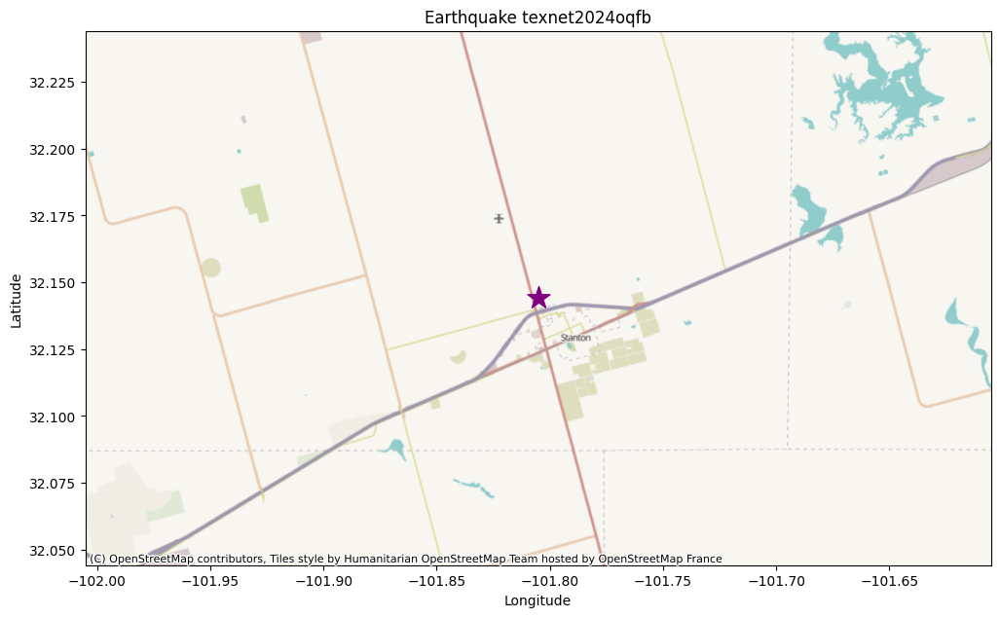

In [0]:
# Should we include nearby seismicity?
zoomx=0.2
zoomy=0.1
print(EQDF)
fig, ax = plt.subplots(figsize=(12,12))
plt.title('Earthquake '+EQDF['EventID'][0])
EQDF.plot(ax=ax,color='purple',marker='*',markersize=300)
xlim=(EQDF['Longitude'][0]-zoomx,EQDF['Longitude'][0]+zoomx)
ylim=(EQDF['Latitude'][0]-zoomy,EQDF['Latitude'][0]+zoomy)
print(xlim)
plt.xlim(xlim)
plt.ylim(ylim)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
cx.add_basemap(ax,zoom=12,crs="EPSG:4326")
plt.show()

#2. Initial Run

In [0]:
# Binary deep/shallow parameter
deepOrShallow='Deep'

In [0]:
baseRunIntervalPath=runPath+deepOrShallow+'/'
initialRunIntervalPath=baseRunIntervalPath+'/initialRun/'
updatedRunIntervalPath=baseRunIntervalPath+'/udpatedRun/'
forecastRunIntervalPath=baseRunIntervalPath+'/forecastRun/'
disposalPath=baseRunIntervalPath+'/updatedDisposal/'
if deepOrShallow=='Deep':
  WellFile=injPath+'/deep.csv'
  InjFile=injPath+'/deepReg.csv'
  OutOfZoneWellFile=injPath+'/shallow.csv'
elif deepOrShallow=='Shallow':
  WellFile=injPath+'/shallow.csv'
  InjFile=injPath+'/shallowReg.csv'
  OutOfZoneWellFile=injPath+'/deep.csv'

In [0]:
allInZoneWellsDF=pd.read_csv(WellFile)
allOutOfZoneWellsDF=pd.read_csv(OutOfZoneWellFile)
RTDF=pd.read_csv(initialRunIntervalPath+'RTDF.csv')
WellsRTDF=pd.read_csv(initialRunIntervalPath+'RTwells.csv')
RTDF['Date']=pd.to_datetime(RTDF['Date'])
WellsRTDF['Date']=pd.to_datetime(WellsRTDF['Date'])

## Subsurface Property Histograms

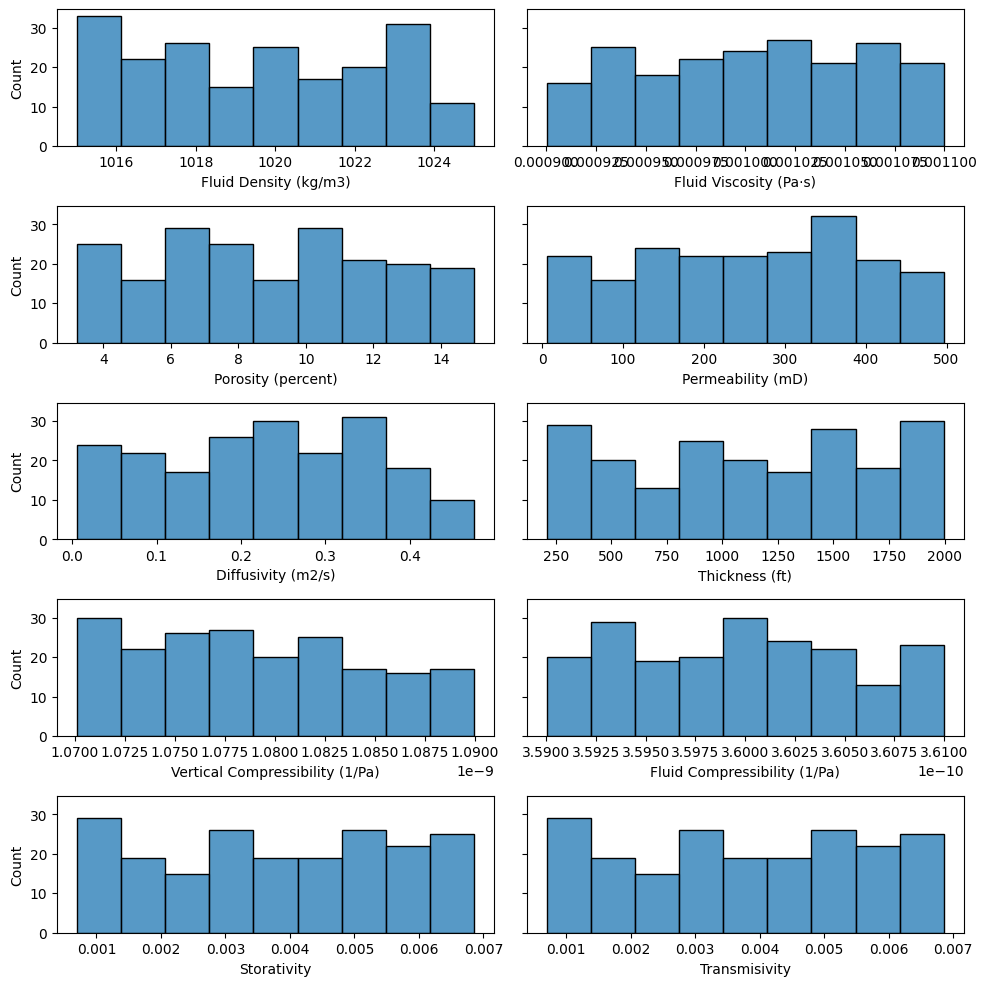

In [0]:
realizationsDF=pd.read_csv(initialRunIntervalPath+'PorePressureRealizations.csv')
gp.histogramMCPP(realizationsDF)

## R-T Well Selection Plots

In [0]:
display(WellsRTDF)
display(RTDF)

Unnamed: 0,ID,InjectionWellId,UniqueWellIdentifier,UICNumber,APINumber,LeaseName,Operator,OperatorType,OperatorPrincipalCompany,OperatorPrincipalCompanyType,WellName,WellNumber,State,Basin,County,District,SRAOrSIR,B3InjectionType,B3InjectionStatus,RegulatoryInjectionType,PermittedMaxLiquidBPD,PermittedMaxLiquidPSIG,PermittedMaxGasMCFPerDay,PermittedMaxGasPSIG,PermittedCommercialStatus,PermittedIntervalTopFt,PermittedIntervalBottomFt,InjectionClass,PermitStage,PermittedWellDepthClassification,DaysApplicationHasBeenInReview,DaysToPermitApproval,PermitIsAmendment,PendingApplicationIsAmendment,PendingApplicationRequestedCommercialStatus,PendingApplicationRequestedIntervalTopFt,PendingApplicationRequestedIntervalBottomFt,PendingApplicationRequestedMaxLiquidBPD,PendingApplicationRequestedMaxLiquidPSIG,PendingApplicationRequestedMaxGasMCFPerDay,PendingApplicationRequestedMaxGasPSIG,PendingApplicationRequestedOperator,PendingApplicationRequestedOperatorType,PendingApplicationRequestedOperatorPrincipalCompany,PendingApplicationRequestedOperatorPrincipalCompanyType,PendingApplicationRequestedWellDepthClassification,CompletedWellDepthClassification,CompletionAndDrillingPermitStatus,StartDate,TotalVerticalDepthFt,MeasuredDepthFt,WellboreOrientation,IsOpenHole,SurfaceHoleElevationFt,SurfaceHoleLatitude,SurfaceHoleLongitude,SurfaceHoleGeographySource,SurveyLinesDescription,B3RecordAddedUTCDateTime,B3RecordUpdatedUTCDateTime,B3RecordDeletedUTCDateTime,Distances,DXs,DYs,DDRatio,YearsInjecting,EncompassingDay,EncompassingDiffusivity,EventID,TotalBBL,Selection,MMBBL,YearsInjectingToEarthquake,Date
0,1007566,7566,10130010000007566,null,30-025-06534,NORTHEAST DRINKARD UNIT,APACHE,E&P,APACHE,E&P,NORTHEAST DRINKARD UNIT #512,512,NM,Permian - Central Basin Platform,Lea,Hobbs,null,Secondary or Tertiary Recovery,Active - Liquid,Injection,null,1145.0,null,null,null,null,null,Class 2 - Injection of fluids associated with oil and natural gas production,Not in Permitting Process,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,Permian Deep,Completed,1937-11-21,7492.0,7492.0,Vertical,null,3430.0,32.49159,-103.13592,Lat/Long from OCD Well Completion,1980 FSL & 1980 FWL,2024-02-19 19:13:46,null,null,130.91821993079813,125.08527154438356,-38.64402480979329,1.0230618616907574,86.68035592060232,1477.0,0.4986153753189559,texnet2024oqfb,0.0,0bbl Disposal,0.0,-86.68035592060232,1937-11-21T00:00:00.000Z
1,1004552,4552,10130010000004552,null,30-025-12345,WEST DOLLARHIDE DRINKARD UNIT,CHEVRON,E&P,CHEVRON,E&P,WEST DOLLARHIDE DRINKARD UNIT #058,058,NM,Permian - Central Basin Platform,Lea,Hobbs,"JAL SRA 3.0 to 3.4 M, 6 Mi",Secondary or Tertiary Recovery,Plugged,Injection,null,1288.0,null,null,null,null,null,Class 2 - Injection of fluids associated with oil and natural gas production,Not in Permitting Process,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,Permian Deep,Drilling Permit Issued,1953-06-02,6850.0,6850.0,Vertical,null,3500.0,32.17201,-103.06669,Lat/Long from OCD Well Completion,1980 FSL & 630 FEL,2024-02-19 19:13:46,null,null,118.82690077214312,118.78653265046316,-3.0971947062775933,1.0249096912057838,71.15126625598904,1310.0,0.500418175926245,texnet2024oqfb,0.0,0bbl Disposal,0.0,-71.15126625598904,1953-06-02T00:00:00.000Z
2,1007324,7324,10130010000007324,null,30-025-06476,EAST BLINEBRY DRINKARD UNIT,APACHE,E&P,APACHE,E&P,EAST BLINEBRY DRINKARD UNIT #013,013,NM,Permian - Central Basin Platform,Lea,Hobbs,null,Secondary or Tertiary Recovery,Administratively Abandoned - Ready To Inject,Injection,null,1217.0,null,null,null,null,null,Class 2 - Injection of fluids associated with oil and natural gas production,Not in Permitting Process,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,Permian Deep,Drilling Permit Issued,1931-12-22,7811.0,7811.0,Vertical,null,null,32.499744,-103.13699,Lat/Long from OCD Well Completion,330 FNL & 1650 FWL,2024-02-19 19:13:46,nul

Unnamed: 0,Distance,d,Years Before Earthquake,Diffusivity,Date
0,9.728102231197193,0.005357994731838,-44.56947296372348,Minimum,1980-01-01T00:00:00.000Z
1,9.718349745305808,0.005357994731838,-44.48015538263385,Minimum,1980-02-03T00:00:00.000Z
2,9.708587462836554,0.005357994731838,-44.39083780154422,Minimum,1980-03-07T00:00:00.000Z
3,9.69881535420738,0.005357994731838,-44.3015202204546,Minimum,1980-04-08T00:00:00.000Z
4,9.689033389687047,0.005357994731838,-44.212202639364975,Minimum,1980-05-11T00:00:00.000Z
5,9.679241539394091,0.005357994731838,-44.122885058275344,Minimum,1980-06-13T00:00:00.000Z
6,9.669439773295752,0.005357994731838,-44.03356747718572,Minimum,1980-07-15T00:00:00.000Z
7,9.659628061206888,0.005357994731838,-43.944249896096096,Minimum,1980-08-17T00:00:00.000Z
8,9.649806372788897,0.005357994731838,-43.85493231500647,Minimum,1980-09-18T00:00:00.000Z
9,9.639974677548633,0.005357994731838,-43.76561473391684,Minimum,1980-10-21T00:00:00.000Z


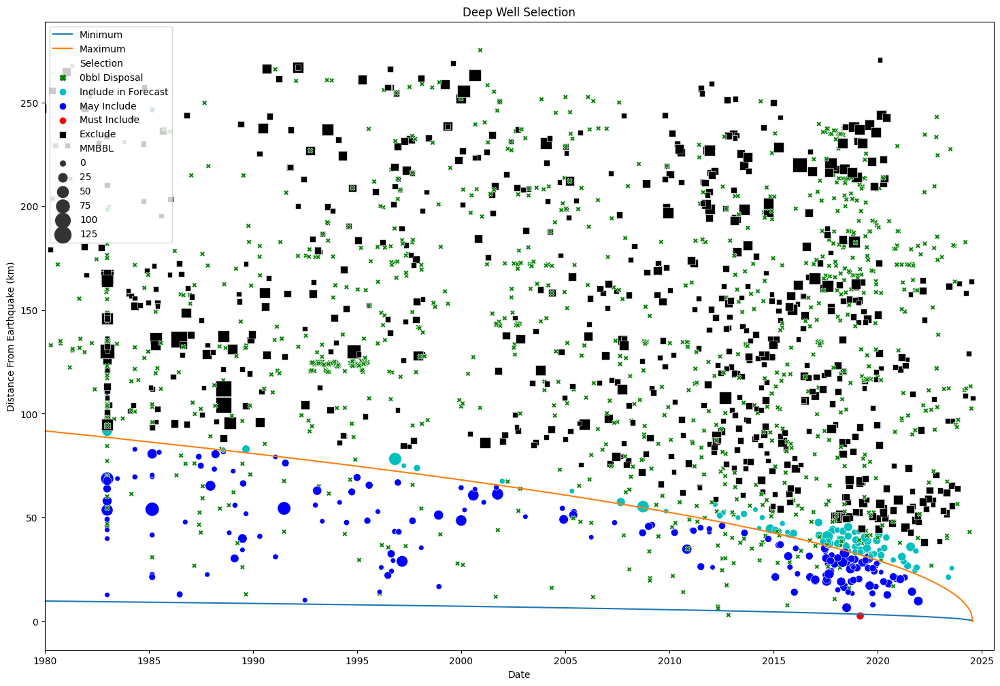

In [0]:
gp.rMinusTPlotPP(WellsRTDF,RTDF,minYear='1980',sizeTuple=(30,300),title=deepOrShallow+' Well Selection',zoom=False,future=True)

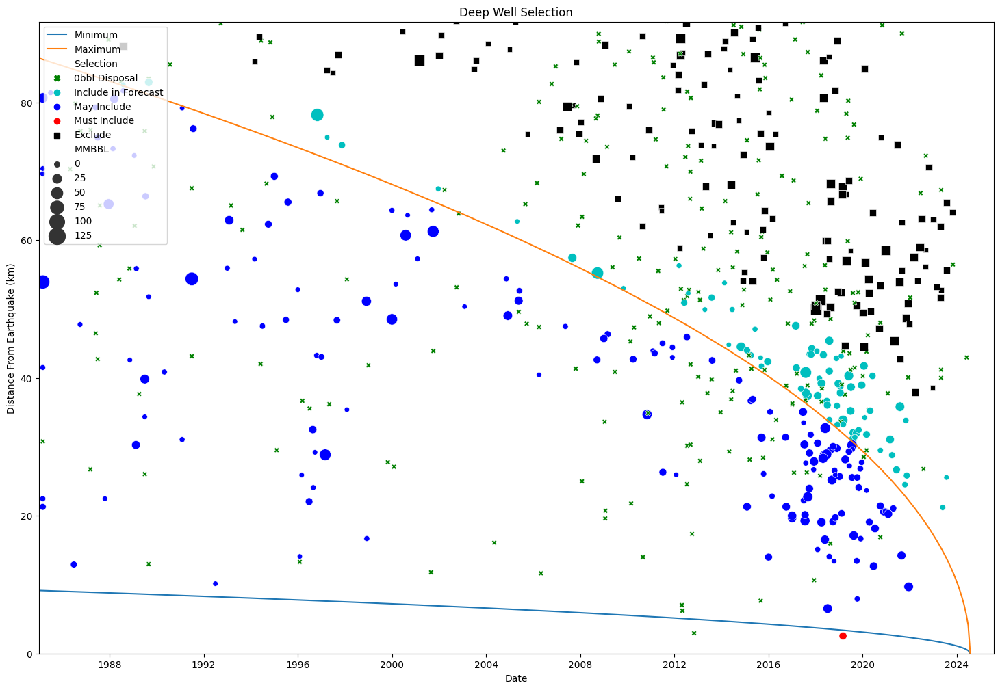

In [0]:
gp.rMinusTPlotPP(WellsRTDF,RTDF,minYear='1985',sizeTuple=(30,300),title=deepOrShallow+' Well Selection',zoom=True)

##Well Selection Maps

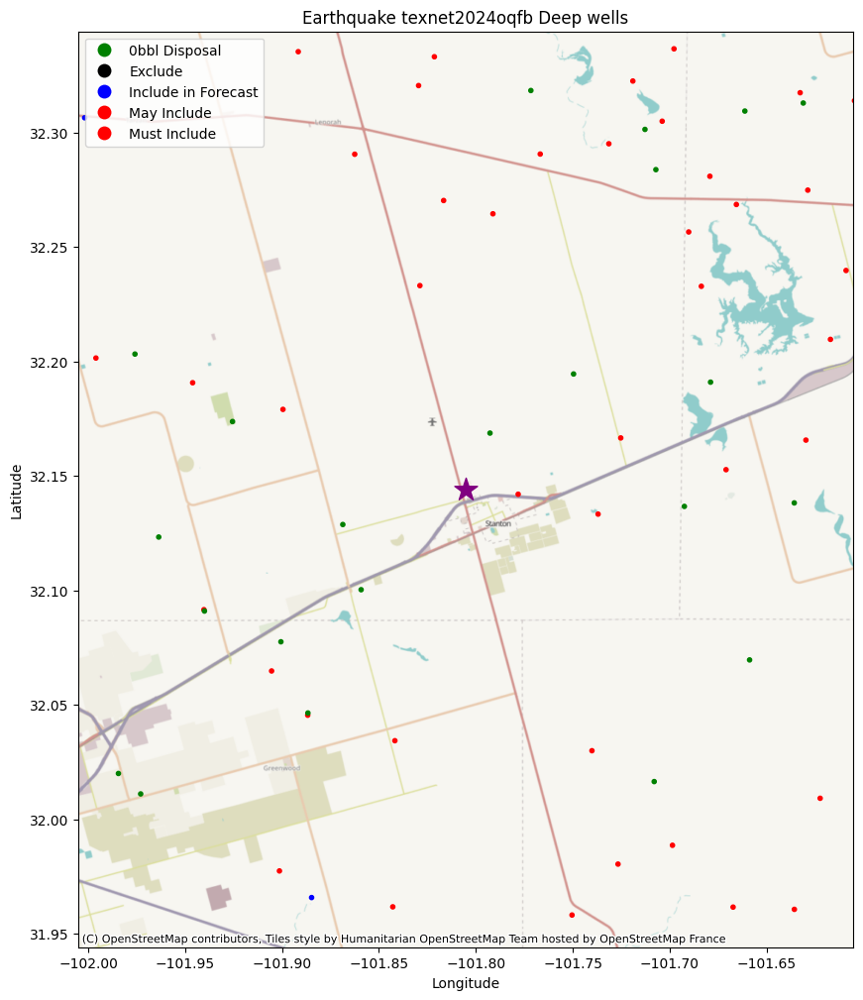

In [0]:
#gp.intervalWellMapPP(EQDF,deepOrShallow,WellsRTDF)
gp.intervalWellMapPP(EQDF,deepOrShallow,WellsRTDF,zoom=0.2)# Map of selected wells and in-zone wells
# Table of corresponding information

In [0]:
displayColumns=['Distances','ID','APINumber','WellName','WellNumber','Operator','PermittedMaxLiquidBPD','StartDate']
print("Must-include wells:")
display(WellsRTDF[WellsRTDF['Selection']=='Must Include'][displayColumns].sort_values('Distances'))
print("May-include wells:")
display(WellsRTDF[WellsRTDF['Selection']=='May Include'][displayColumns].sort_values('Distances'))
print("Wells with no in-zone disposal within 50km:")
display(WellsRTDF[(WellsRTDF['Selection']=='0bbl Disposal') & (WellsRTDF['Distances']<50.)][displayColumns].sort_values('Distances'))
print("Excluded wells within 50km:")
display(WellsRTDF[(WellsRTDF['Selection']=='Exclude') & (WellsRTDF['Distances']<50.)][displayColumns].sort_values('Distances'))

Must-include wells:


Distances,ID,APINumber,WellName,WellNumber,Operator,PermittedMaxLiquidBPD,StartDate
2.558174400264295,2121094,42-317-41652,MARIENFELD 13 1D,1D,PIONEER NATURAL RESOURCES,30000.0,2019-03-01


May-include wells:


Distances,ID,APINumber,WellName,WellNumber,Operator,PermittedMaxLiquidBPD,StartDate
6.542261331370596,2121271,42-317-41325,ANNALEA SWD 1,1,SM ENERGY,35000.0,2018-07-06
7.934466562017759,2114817,42-317-42432,SALT LAKE SWD 1,1,OVERFLOW ENERGY PERMIAN,30000.0,2019-10-09
9.69368840138171,2123938,42-317-43701,PALO VERDE 1,1,STONEHILL MARTIN,40000.0,2021-12-14
10.145073709797517,2072223,42-317-32928,"SUPERIOR STRAIN \""-SWD- 1D",1D,WALSH & WATTS,4000.0,1992-07-01
12.684394410659095,2117885,42-227-40294,FAUDREE 1D,1D,OXYROCK OPERATING,25000.0,2020-06-18
12.690632722359036,2018967,42-329-01297,MASHBURN 2,2,STEPHENS AUTRY C,1000.0,1983-01-01
12.92314260135016,2056720,42-329-31484,PENROSE-OLDHAM SWD 2,2,DE IV OPERATING,7500.0,1986-06-26
13.397749546353452,2119799,42-329-42355,"EPLEY, L.B. 18D",18D,RATTLER MIDSTREAM OPERATING,40000.0,2018-10-13
13.450778071467187,2113898,42-317-41765,DAGGER LAKE SWD 08SD,08SD,XTO ENERGY,25000.0,2019-10-01
14.00767414998453,2109094,42-317-40301,DICKENSON 20 8D,8D,DEEP BLUE OPERATING,50000.0,2016-01-01


Wells with no in-zone disposal within 50km:


Distances,ID,APINumber,WellName,WellNumber,Operator,PermittedMaxLiquidBPD,StartDate
2.974654557369253,2119388,42-317-00104,"FLANAGAN, ANNIE OIL MANAGEMENT 1",1,ARYA RESOURCES,4000.0,2012-11-02
6.215716220020589,2100217,42-317-00172,"MCADAMS, GARNER 2",2,DIAMONDBACK E&P,6000.0,2012-05-04
7.047485191377316,2100192,42-317-00173,"YATER, MILT 1",1,DIAMONDBACK E&P,6000.0,2012-04-26
7.6698527693483936,2118838,42-317-34586,ALLAR 45 2,2,COBRA O&G,3000.0,2015-09-01
10.65664585698369,2111437,42-227-37594,"HOOPSNAKE \""23\"" 2",2,SM ENERGY,30000.0,2017-12-08
11.646152275655137,2092926,42-329-31249,PENROSE-OLDHAM 4,4,SELECT WATER SOLUTIONS,10000.0,2006-05-01
11.803007564394914,2088016,42-317-32854,YATER SWD 2W,2W,ENVIRONMENTAL DISPOSAL SYSTEMS,30000.0,2001-08-29
12.98292881116933,2067332,42-227-34379,1WD,1WD,FASKEN BARBARA,500.0,1989-08-31
13.30496168006024,2079881,42-329-31571,"EPLEY, L. B. 8D",8D,DEEP BLUE OPERATING,20000.0,1996-02-01
14.012019566988023,2120442,42-317-34301,"DICKENSON \""20\"" 3WD",3WD,DEEP BLUE OPERATING,12000.0,2010-08-31


Excluded wells within 50km:


Distances,ID,APINumber,WellName,WellNumber,Operator,PermittedMaxLiquidBPD,StartDate
37.96407756102657,2113956,42-329-42941,SHACKELFORD 42 1DD,1DD,PIONEER NATURAL RESOURCES,25000.0,2022-03-24
38.57255905260538,2129382,42-173-36370,SHELBY SWD 2,2,AQUA TERRA PERMIAN,20000.0,2022-12-22
42.74630998026407,2127004,42-317-43409,BREEDLOVE URSA 2D,2D,DEEP BLUE OPERATING,20000.0,2021-08-01
44.53583066770444,2114878,42-003-48054,MABEE 12 SWD 1,1,HIGH LONESOME MIDSTREAM,60000.0,2020-01-17
44.71686146292125,2121605,42-317-41454,UNIVERSITY 7-31B D 1,D 1,DEEP BLUE OPERATING,40000.0,2019-03-29
45.42408057293501,2121228,42-227-40963,LONG 350 SWD 1,1,GRAVITY WATER MIDSTREAM,35000.0,2021-05-01
47.21882254280844,2116930,42-329-43904,RIPTIDE 29 SWD 1,1,ENVIRONMENTAL DISPOSAL SYSTEMS,30000.0,2020-09-10
47.90140040224983,2128523,42-227-41332,FRYAR 3S 2XD,2XD,BAYSWATER OPERATING,20000.0,2021-12-22
48.74631227890925,2116375,42-227-41311,JACK BUCHANAN SR SWD 1,1,GRAVITY WATER MIDSTREAM,35000.0,2021-11-01
49.29053231533462,2112256,42-227-03055,"ZANT, H. N. 6",6,"DKL WATER GATHERING PERMIAN, LLC",10000.0,2018-06-21


##Pressure disaggregation plots

 disaggregationPlotPP: figure height is  10.0


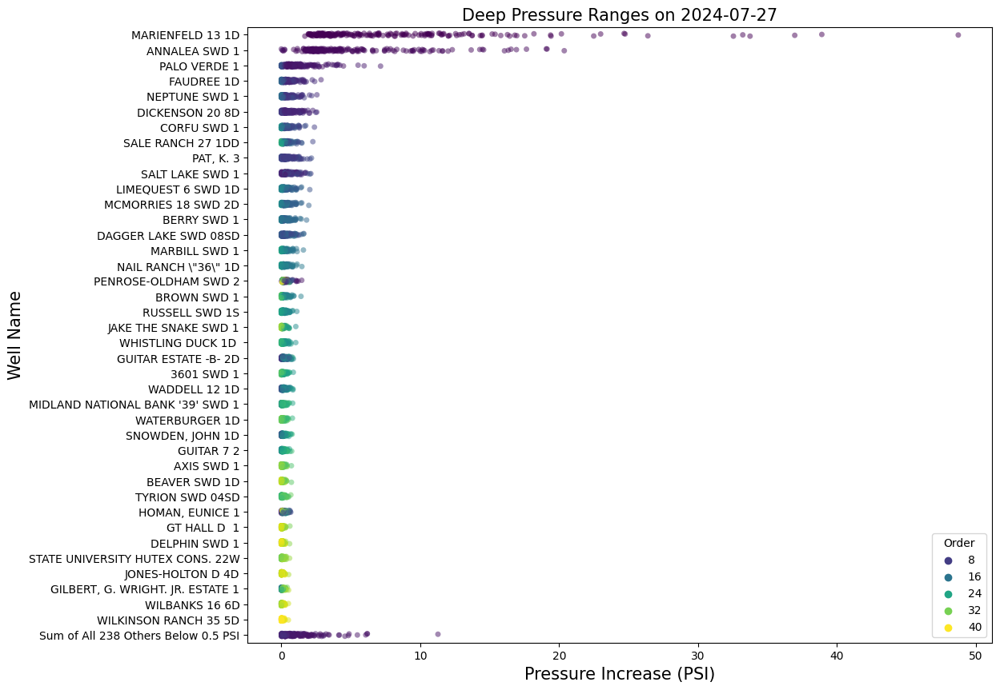

In [0]:
summaryPPDF=pd.read_csv(initialRunIntervalPath+'filteredScenarios.csv')
wellOrder=pd.read_csv(initialRunIntervalPath+'wellOrder.csv')['Name'].values
gp.disaggregationPlotPP(summaryPPDF,wellOrder,deepOrShallow+' Pressure Ranges on '+str(EQDF['Origin Date'].loc[0]),verbose=2)

##Pressure Time Series

In [0]:
selectedWellsDF=pd.read_csv(disposalPath+'/selectedWells.csv')
ignoredWellsDF=pd.read_csv(disposalPath+'/ignoredWells.csv')
injDF=pd.read_csv(disposalPath+'/inj.csv')
injDF['Date']=pd.to_datetime(injDF['Date'])
tsFile=np.load(initialRunIntervalPath+'/timeSeriesR.npz')
deltaPP=tsFile['deltaPP']
dayVec=tsFile['dayVec']
wellIDs=tsFile['wellIDs']
print(deltaPP.shape)
nW=len(wellIDs)
nReal=deltaPP.shape[1]
nt=deltaPP.shape[2]
totalDeltaPP=deltaPP.sum(axis=0)
print(totalDeltaPP.shape)

(39, 200, 1470)
(200, 1470)


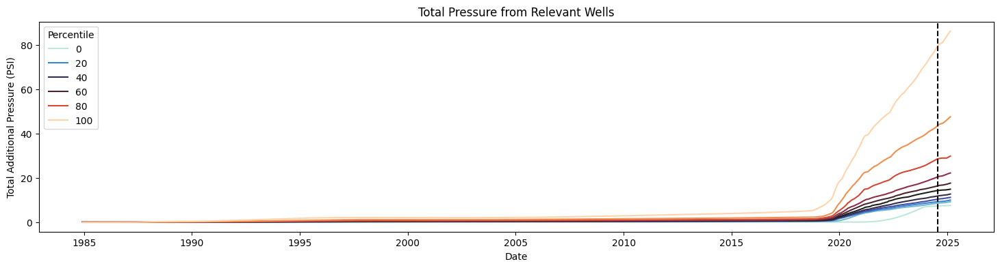

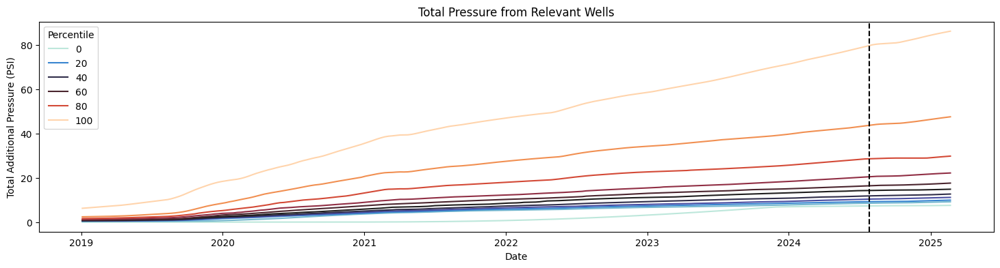

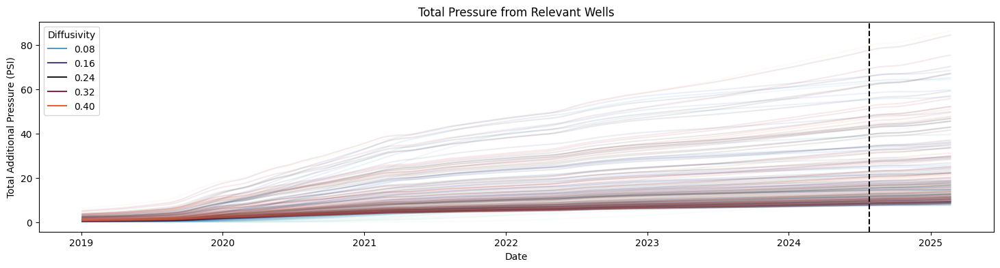

In [0]:
totalPPQuantilesDF=pd.read_csv(initialRunIntervalPath+'totalPPQuantiles.csv')
totalPPSpaghettiDF=pd.read_csv(initialRunIntervalPath+'totalPPSpaghetti.csv')
gp.totalPressurePlot(totalPPQuantilesDF,eq=EQDF)
gp.totalPressurePlot(totalPPQuantilesDF,startDate=pd.to_datetime('2019-01-01'),eq=EQDF)
gp.totalPressureSpaghettiPlot(totalPPSpaghettiDF,startDate=pd.to_datetime('2019-01-01'),eq=EQDF)

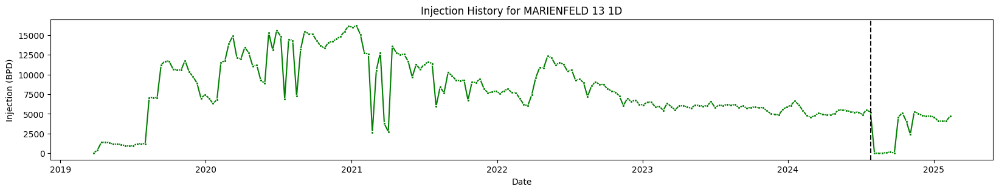

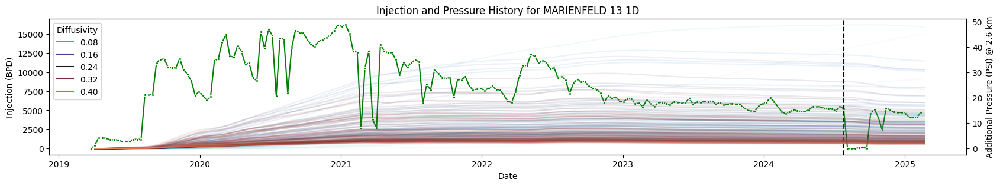

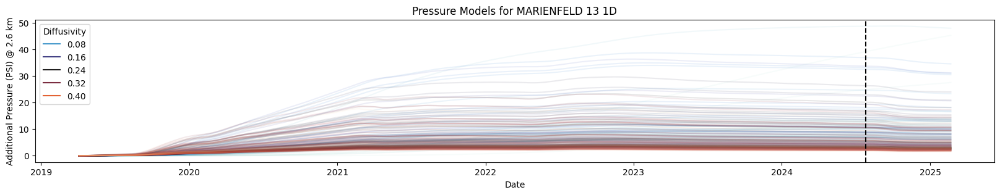

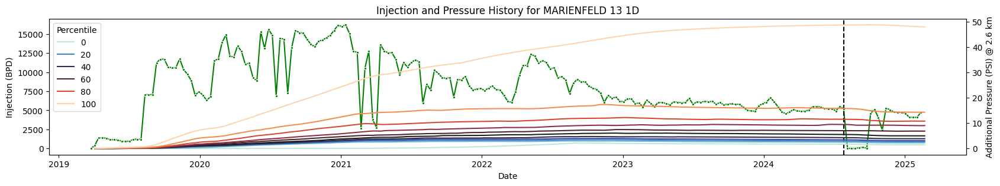

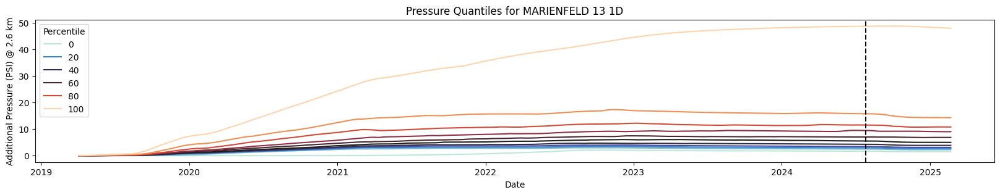

...

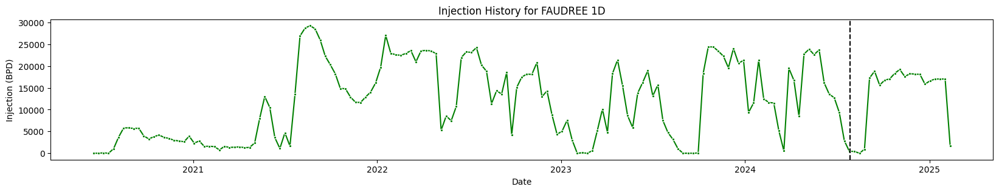

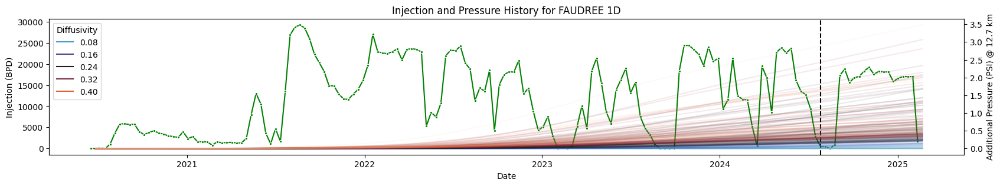

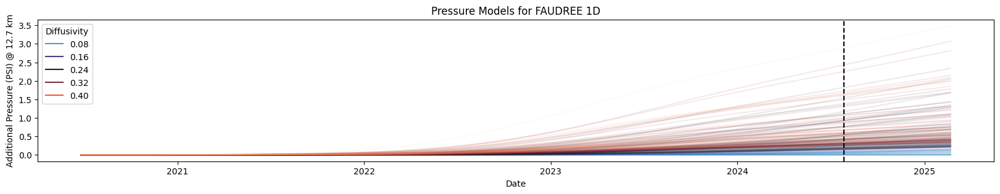

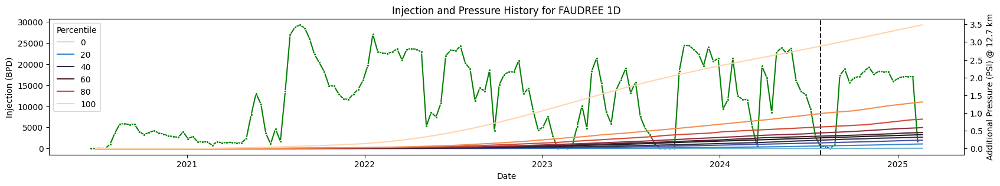

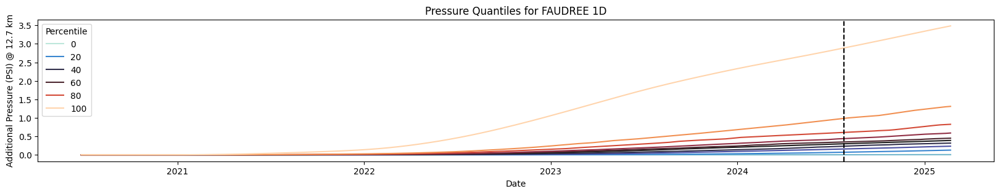

In [0]:
wellNames=wellOrder[:-1]
# Loop over wells of interest
for iw in range(4):
  oneWellInfoDF=pd.read_csv(initialRunIntervalPath+'/perWell/well_'+str(iw)+'_WellInfo.csv')
  oneWellInjDF=pd.read_csv(initialRunIntervalPath+'/perWell/well_'+str(iw)+'_Disposal.csv')
  oneWellQuantilesPPDF=pd.read_csv(initialRunIntervalPath+'/perWell/well_'+str(iw)+'_PPQuantiles.csv')
  oneWellSpaghettiPPDF=pd.read_csv(initialRunIntervalPath+'/perWell/well_'+str(iw)+'_Spaghetti.csv')
  gp.disposalPlot(oneWellInfoDF,oneWellInjDF,eq=EQDF,forecast=False)
  gp.disposalAndSpaghettiPlot(oneWellInfoDF,oneWellInjDF,oneWellSpaghettiPPDF,eq=EQDF,forecast=False)
  gp.spaghettiPlot(oneWellInfoDF,oneWellInjDF,oneWellSpaghettiPPDF,eq=EQDF,forecast=False)
  gp.disposalAndPressurePlot(oneWellInfoDF,oneWellInjDF,oneWellQuantilesPPDF,eq=EQDF,forecast=False)
  gp.pressurePlot(oneWellInfoDF,oneWellInjDF,oneWellQuantilesPPDF,eq=EQDF,forecast=False)

In [0]:
sensitivityDF=pd.read_csv(initialRunIntervalPath+'sensitivity.csv')
sensitivitySumDF=pd.read_csv(initialRunIntervalPath+'sensitivitySum.csv')

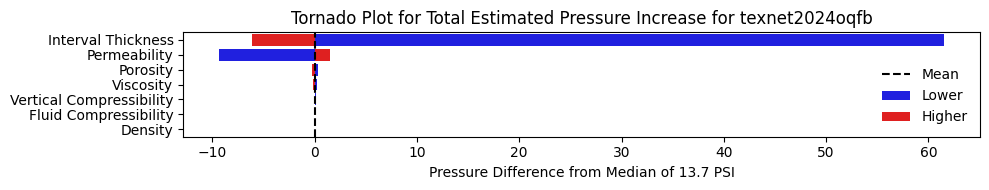

In [0]:
gp.totalTornadoPlot(sensitivitySumDF)

FAUDREE 1D


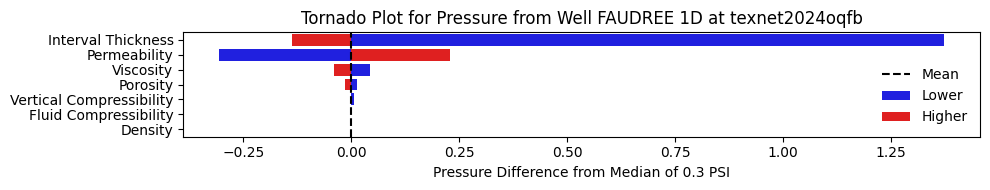

MARIENFELD 13 1D


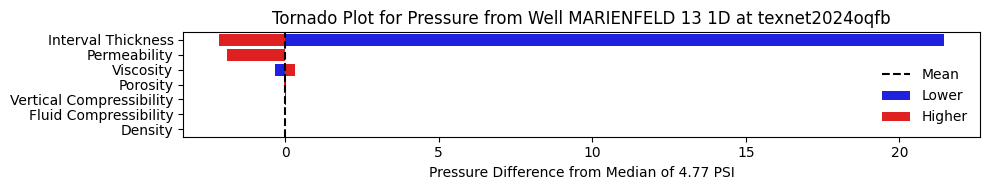

PALO VERDE 1


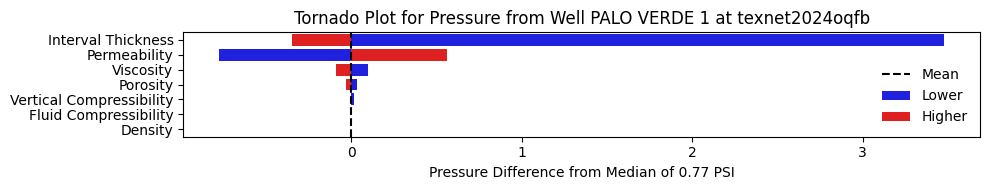

ANNALEA SWD 1


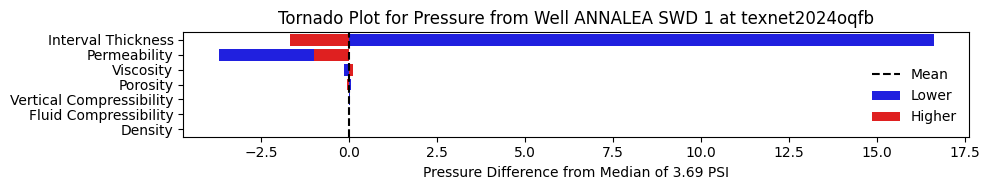

In [0]:
gp.perWellTornadoPlot(sensitivityDF[sensitivityDF['Name'].isin(wellNames[:3])],verbose=1)

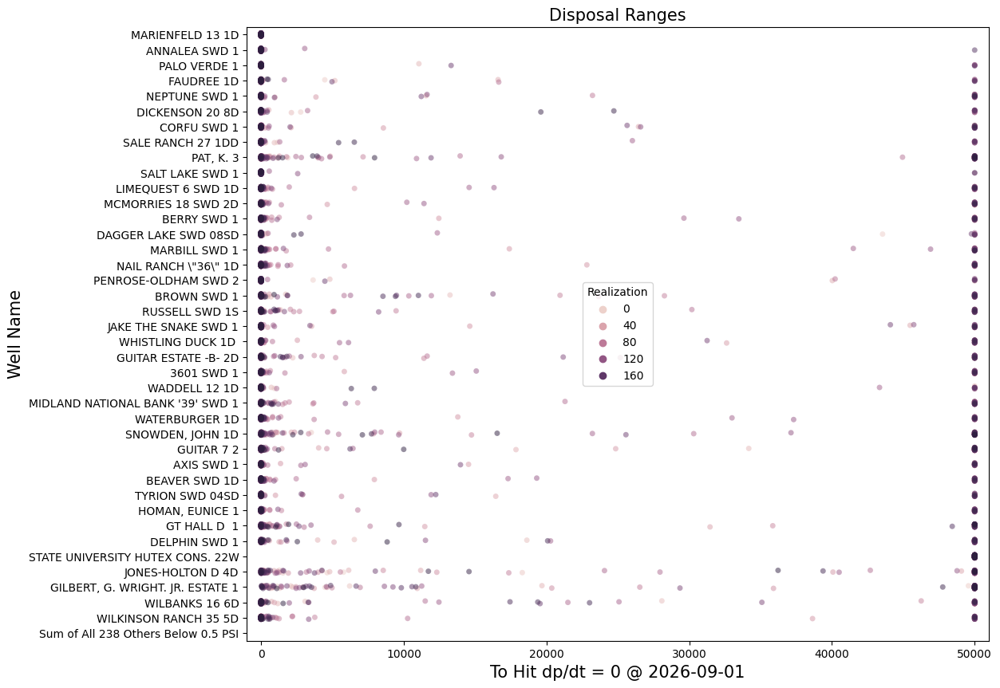

In [0]:
rateDF=pd.read_csv(initialRunIntervalPath+'rates.csv')
fig, ax = plt.subplots(figsize=(12,10))
# Sort by maximum rate
sns.stripplot(data=rateDF,x='THdpdt0',y='Name',hue='Realization',dodge=False,jitter=True,alpha=0.5,linewidth=0,edgecolor='white',ax=ax,size=5,order=wellOrder)
ax.set_title('Disposal Ranges',fontsize=15)
ax.set_xlabel('To Hit dp/dt = 0 @ '+rateDF['FutureDate'][0],fontsize=15)
ax.set_ylabel('Well Name',fontsize=15)
ax.set_xlim(-1000,51000)
plt.show()

#3. Correct Data

##Tables of Output Well Information

##Tables of Uploaded Well Information